---
title: Sentinel-3 Multi-Product Demo with GDAL
subtitle: Comprehensive demonstration of accessing multiple Sentinel-3 product types using GDAL EOPFZARR driver
authors:
  - name: Yuvraj Bhagwan Adagale
    orcid: 0009-0008-1259-3399
    github: Yuvraj198920
    affiliations:
      - id: Eurac Research
        institution: Eurac Research
        ror: 01xt1w755
date: 2025-01-23
thumbnail: ../static/ESA_EOPF_logo_2025_COLOR_ESA_blue_reduced.png
tags: ["gdal", "sentinel-3", "basic", "advanced"]
releaseDate: 2025-01-23
datePublished: 2025-01-23
dateModified: 2025-01-23
github: https://github.com/EOPF-Sample-Service/eopf-sample-notebooks
license: Apache-2.0
---

```{image} ../static/ESA_EOPF_logo_2025_COLOR_ESA_blue_reduced.png
:alt: ESA EOPF Zarr Logo
:width: 250px
:align: center
```

# Table of Contents

0. [Introduction](#Introduction_S3_MULTI)
1. [Product Overview and Subdataset Discovery](#Product_Overview_S3_MULTI)
2. [OLCI Level-1 EFR - Full Resolution Radiances](#OLCI_L1_EFR_S3_MULTI)
3. [OLCI Level-1 ERR - Reduced Resolution](#OLCI_L1_ERR_S3_MULTI)
4. [OLCI Level-2 LFR - Land Products](#OLCI_L2_LFR_S3_MULTI)
5. [SLSTR Level-1 RBT - Radiances and Brightness Temperatures](#SLSTR_L1_RBT_S3_MULTI)
6. [SLSTR Level-2 LST - Land Surface Temperature](#SLSTR_L2_LST_S3_MULTI)
7. [Geographic Coordinates](#Geographic_Coordinates_S3_MULTI)
8. [Product Comparison Summary](#Summary_S3_MULTI)

---

(Introduction_S3_MULTI)=
## Introduction

This notebook provides a comprehensive demonstration of accessing and analyzing multiple Sentinel-3 product types using the GDAL EOPFZARR driver. Sentinel-3 is a European Space Agency (ESA) Earth observation satellite mission that provides a wide range of data products for monitoring land, ocean, and atmospheric parameters.

The notebook showcases how to work with five different Sentinel-3 product types:

- **OLCI (Ocean and Land Colour Instrument)**: Optical imagery for land and ocean applications
  - Level-1 EFR: Full resolution top-of-atmosphere radiances (300m)
  - Level-1 ERR: Reduced resolution radiances (1.2km)
  - Level-2 LFR: Land products including vegetation indices

- **SLSTR (Sea and Land Surface Temperature Radiometer)**: Thermal and visible/near-infrared measurements
  - Level-1 RBT: Radiances and brightness temperatures
  - Level-2 LST: Derived land surface temperature

Using GDAL's EOPFZARR driver, we can efficiently access these cloud-optimized Zarr datasets directly from remote object storage without downloading entire files. This approach enables scalable analysis of large satellite datasets.

By the end of this notebook, you will understand how to:
- Discover and explore subdatasets within Sentinel-3 products
- Access specific measurements and quality flags
- Visualize multi-spectral and thermal imagery
- Work with geographic coordinates for geolocation
- Compare different product types and their characteristics

:::{hint} Overview

**Questions**
- How do we access multiple Sentinel-3 product types using GDAL's EOPFZARR driver?
- What subdatasets are available within each product type?
- How can we efficiently read and visualize remote Zarr datasets without full downloads?
- What are the differences between OLCI and SLSTR instruments and their product levels?

**Objectives**
- Demonstrate accessing five different Sentinel-3 product types (OLCI L1/L2, SLSTR L1/L2) using GDAL
- Show how to discover and explore subdatasets within each product
- Illustrate reading and visualizing multi-spectral and thermal data from cloud storage
- Explain how to work with geographic coordinates for proper geolocation
- Compare characteristics and use cases across different Sentinel-3 products
:::

(Product_Overview_S3_MULTI)=
## Product Overview and Subdataset Discovery

Let's explore each product's structure and available subdatasets.

(OLCI_L1_EFR_S3_MULTI)=
## OLCI Level-1 EFR - Full Resolution Radiances

The OLCI L1 EFR product contains Top-of-Atmosphere (TOA) radiances at 300m resolution with 21 spectral bands.

(OLCI_L1_ERR_S3_MULTI)=
## OLCI Level-1 ERR - Reduced Resolution

(OLCI_L2_LFR_S3_MULTI)=
## OLCI Level-2 LFR - Land Products

(SLSTR_L1_RBT_S3_MULTI)=
## SLSTR Level-1 RBT - Radiances and Brightness Temperatures

In [1]:
# Import required libraries
from osgeo import gdal
import matplotlib.pyplot as plt
import numpy as np

# Note: xarray import skipped due to version compatibility issues
# We use pure numpy/GDAL approach instead
import warnings

warnings.filterwarnings("ignore")

# Enable GDAL exceptions
gdal.UseExceptions()

# Verify EOPFZARR driver is available
driver = gdal.GetDriverByName("EOPFZARR")
if driver:
    print(f"✅ EOPFZARR driver loaded: {driver.LongName}")
else:
    print("❌ EOPFZARR driver not found!")

print(f"GDAL version: {gdal.__version__}")

✅ EOPFZARR driver loaded: EOPF Zarr Wrapper Driver
GDAL version: 3.12.0dev-209c099c56


/home/yadagale/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


In [2]:
# Define all Sentinel-3 product URLs
PRODUCTS = {
    "OLCI_L1_EFR": {
        "name": "Sentinel-3 OLCI Level-1 EFR (Full Resolution)",
        "url": "https://objects.eodc.eu/e05ab01a9d56408d82ac32d69a5aae2a:202508-s03olcefr/19/products/"
        "cpm_v256/S3B_OL_1_EFR____20250819T074058_20250819T074358_20250819T092155_0179_110_106_3420_ESA_O_NR_004.zarr",
        "description": "TOA Radiances - 21 spectral bands (400-1020nm)",
        "sample_band": "measurements/oa01_radiance",
    },
    "OLCI_L1_ERR": {
        "name": "Sentinel-3 OLCI Level-1 ERR (Reduced Resolution)",
        "url": "https://objects.eodc.eu/e05ab01a9d56408d82ac32d69a5aae2a:202510-s03olcerr-global/19/products/"
        "cpm_v256/S3A_OL_1_ERR____20251019T145533_20251019T153950_20251019T165332_2657_131_353______PS1_O_NR_004.zarr",
        "description": "TOA Radiances - Reduced resolution (1.2km)",
        "sample_band": "measurements/oa01_radiance",
    },
    "OLCI_L2_LFR": {
        "name": "Sentinel-3 OLCI Level-2 LFR (Land Full Resolution)",
        "url": "https://objects.eodc.eu/e05ab01a9d56408d82ac32d69a5aae2a:202508-s03olclfr/17/products/"
        "cpm_v256/S3A_OL_2_LFR____20250817T085058_20250817T085358_20250818T125249_0179_129_221_2160_PS1_O_NT_003.zarr",
        "description": "Land products - OGVI, OTCI, RC681, etc.",
        "sample_band": None,  # Will discover
    },
    "SLSTR_L1_RBT": {
        "name": "Sentinel-3 SLSTR Level-1 RBT",
        "url": "https://objects.eodc.eu/e05ab01a9d56408d82ac32d69a5aae2a:202510-s03slsrbt-global/19/products/"
        "cpm_v256/S3A_SL_1_RBT____20251019T064521_20251019T064821_20251019T085627_0179_131_348_2700_PS1_O_NR_004.zarr",
        "description": "Radiances and Brightness Temperatures",
        "sample_band": None,  # Will discover
    },
    "SLSTR_L2_LST": {
        "name": "Sentinel-3 SLSTR Level-2 LST",
        "url": "https://objects.eodc.eu/e05ab01a9d56408d82ac32d69a5aae2a:202512-s03slslst-eu/04/products/"
        "cpm_v262/S3A_SL_2_LST____20251204T100846_20251204T101146_20251204T122129_0179_133_236_2340_PS1_O_NR_004.zarr",
        "description": "Land Surface Temperature",
        "sample_band": None,  # Will discover
    },
}

In [3]:
# Helper function for eopfzarr paths
def eopfzarr_path(url, subdataset=None):
    """Construct EOPFZARR path for remote access

    Note: The subdataset path MUST start with '/' for GEOLOCATION metadata to work.
    This is required by the EOPFZARR driver for proper geolocation array handling.
    """
    base = f'EOPFZARR:"/vsicurl/{url}"'
    if subdataset:
        # Ensure subdataset starts with '/' for geolocation arrays
        if not subdataset.startswith("/"):
            subdataset = "/" + subdataset
        return f"{base}:{subdataset}"
    return base


print(f"Configured {len(PRODUCTS)} Sentinel-3 products for analysis")

Configured 5 Sentinel-3 products for analysis


(SLSTR_L2_LST_S3_MULTI)=
## SLSTR Level-2 LST - Land Surface Temperature

In [4]:
def explore_product(product_key, max_subdatasets=15):
    """Explore a Sentinel-3 product and list its subdatasets"""
    product = PRODUCTS[product_key]
    print(f"\n{'='*80}")
    print(f"📦 {product['name']}")
    print(f"{'='*80}")
    print(f"Description: {product['description']}")
    print(f"URL: ...{product['url'][-60:]}")

    try:
        ds = gdal.Open(eopfzarr_path(product["url"]))
        if ds is None:
            print("❌ Failed to open dataset")
            return None

        print(f"\nDriver: {ds.GetDriver().ShortName}")
        print(f"Size: {ds.RasterXSize} x {ds.RasterYSize}")

        # Get projection info
        proj = ds.GetProjection()
        if proj:
            # Extract EPSG if available
            if "EPSG" in proj:
                import re

                epsg_match = re.search(r'EPSG","?(\d+)', proj)
                if epsg_match:
                    print(f"CRS: EPSG:{epsg_match.group(1)}")

        # Get subdatasets
        subdatasets = ds.GetMetadata("SUBDATASETS")
        subdataset_list = []

        for key, value in subdatasets.items():
            if key.startswith("SUBDATASET_") and "_NAME" in key:
                path = value.split(":")[-1]
                subdataset_list.append(path)

        print(f"\nSubdatasets: {len(subdataset_list)} total")
        print("\nSample subdatasets:")
        for i, sd in enumerate(subdataset_list[:max_subdatasets]):
            print(f"  {i+1:2d}. {sd}")
        if len(subdataset_list) > max_subdatasets:
            print(f"  ... and {len(subdataset_list) - max_subdatasets} more")

        ds = None
        return subdataset_list

    except Exception as e:
        print(f"❌ Error: {e}")
        return None


# Explore all products
product_subdatasets = {}
for key in PRODUCTS.keys():
    product_subdatasets[key] = explore_product(key)


📦 Sentinel-3 OLCI Level-1 EFR (Full Resolution)
Description: TOA Radiances - 21 spectral bands (400-1020nm)
URL: ...9T074358_20250819T092155_0179_110_106_3420_ESA_O_NR_004.zarr

Driver: EOPFZARR
Size: 512 x 512
CRS: EPSG:7030

Subdatasets: 123 total

Sample subdatasets:
   1. /conditions/geometry/latitude
   2. /conditions/geometry/longitude
   3. /conditions/geometry/oaa
   4. /conditions/geometry/oza
   5. /conditions/geometry/saa
   6. /conditions/geometry/sza
   7. /conditions/image/altitude
   8. /conditions/image/detector_index
   9. /conditions/image/frame_offset
  10. /conditions/image/latitude
  11. /conditions/image/longitude
  12. /conditions/instrument/fwhm
  13. /conditions/instrument/lambda0
  14. /conditions/instrument/relative_spectral_covariance
  15. /conditions/instrument/solar_flux
  ... and 108 more

📦 Sentinel-3 OLCI Level-1 ERR (Reduced Resolution)
Description: TOA Radiances - Reduced resolution (1.2km)
URL: ...9T153950_20251019T165332_2657_131_353______PS1_O_NR

(Geographic_Coordinates_S3_MULTI)=
## Geographic Coordinates

Let's demonstrate accessing geographic coordinates for proper geolocation.

In [5]:
def read_band_data(url, subdataset, size=None):
    """Read band data from a subdataset"""
    path = eopfzarr_path(url, subdataset)
    ds = gdal.Open(path)
    if ds is None:
        raise ValueError(f"Cannot open {subdataset}")

    band = ds.GetRasterBand(1)

    if size is None:
        data = band.ReadAsArray().astype(np.float32)
    else:
        # Read a subset
        width = min(size, ds.RasterXSize)
        height = min(size, ds.RasterYSize)
        data = band.ReadAsArray(0, 0, width, height).astype(np.float32)

    nodata = band.GetNoDataValue()
    if nodata is not None:
        data[data == nodata] = np.nan

    metadata = {
        "width": ds.RasterXSize,
        "height": ds.RasterYSize,
        "nodata": nodata,
        "dtype": band.DataType,
    }

    ds = None
    return data, metadata


# Read OLCI L1 EFR bands
print("Reading OLCI L1 EFR spectral bands...")

olci_bands = {
    "Oa01 (400nm)": "measurements/oa01_radiance",
    "Oa06 (560nm)": "measurements/oa06_radiance",
    "Oa08 (665nm)": "measurements/oa08_radiance",
    "Oa17 (865nm)": "measurements/oa17_radiance",
}

olci_data = {}
for name, subdataset in olci_bands.items():
    try:
        data, meta = read_band_data(
            PRODUCTS["OLCI_L1_EFR"]["url"], subdataset, size=1000
        )
        olci_data[name] = data
        print(
            f"  ✅ {name}: {data.shape}, range [{np.nanmin(data):.2f}, {np.nanmax(data):.2f}]"
        )
    except Exception as e:
        print(f"  ❌ {name}: {e}")

Reading OLCI L1 EFR spectral bands...
  ✅ Oa01 (400nm): (1000, 1000), range [68.84, 103.83]
  ✅ Oa06 (560nm): (1000, 1000), range [42.62, 129.86]
  ✅ Oa08 (665nm): (1000, 1000), range [30.09, 130.64]
  ✅ Oa17 (865nm): (1000, 1000), range [27.74, 103.16]


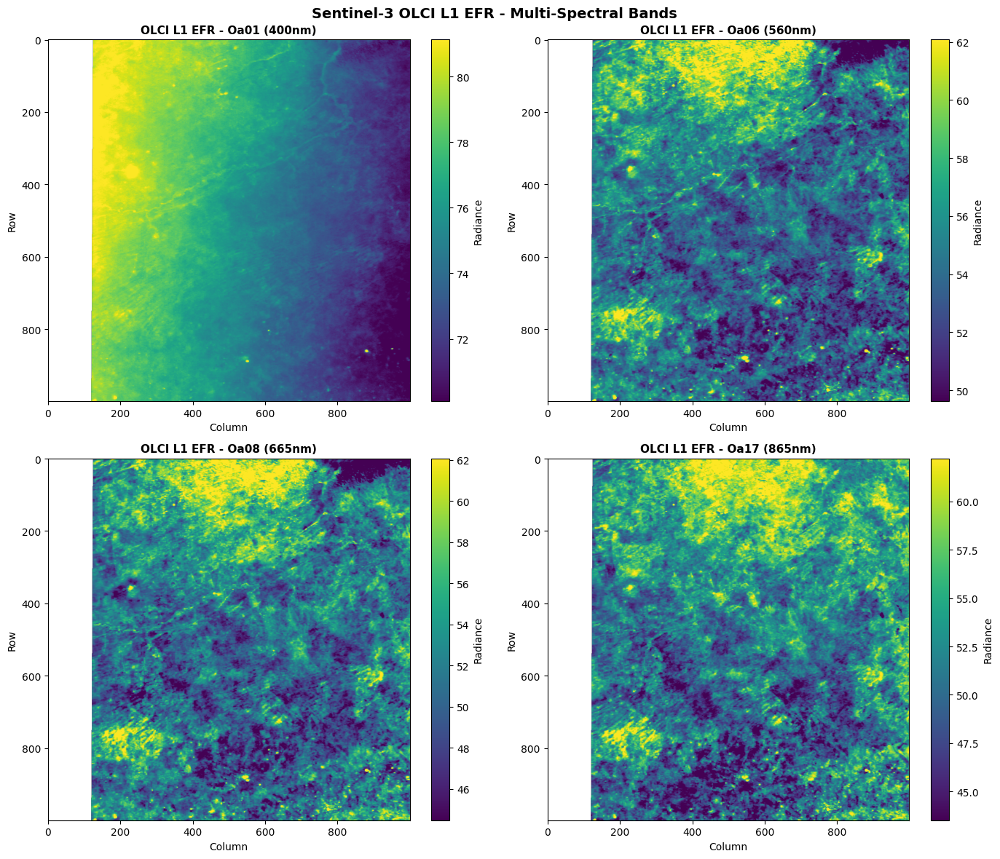

✅ OLCI L1 EFR visualization complete!


In [6]:
# Visualize OLCI L1 EFR bands
if olci_data:
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    axes = axes.flatten()

    for idx, (name, data) in enumerate(olci_data.items()):
        # Use robust percentile scaling
        vmin, vmax = np.nanpercentile(data, [2, 98])
        im = axes[idx].imshow(data, cmap="viridis", vmin=vmin, vmax=vmax)
        axes[idx].set_title(f"OLCI L1 EFR - {name}", fontsize=11, fontweight="bold")
        axes[idx].set_xlabel("Column")
        axes[idx].set_ylabel("Row")
        plt.colorbar(im, ax=axes[idx], label="Radiance", fraction=0.046)

    plt.suptitle(
        "Sentinel-3 OLCI L1 EFR - Multi-Spectral Bands", fontsize=14, fontweight="bold"
    )
    plt.tight_layout()
    plt.show()

    print("✅ OLCI L1 EFR visualization complete!")

(Summary_S3_MULTI)=
## Product Comparison Summary

Reading OLCI L1 ERR (Reduced Resolution) spectral bands...
  ✅ Oa01 (400nm): (800, 800), range [18.07, 153.01]
  ✅ Oa01 (400nm): (800, 800), range [18.07, 153.01]
  ✅ Oa06 (560nm): (800, 800), range [7.30, 208.61]
  ✅ Oa06 (560nm): (800, 800), range [7.30, 208.61]
  ✅ Oa08 (665nm): (800, 800), range [3.94, 197.30]
  ✅ Oa08 (665nm): (800, 800), range [3.94, 197.30]
  ✅ Oa17 (865nm): (800, 800), range [0.88, 129.69]
  ✅ Oa17 (865nm): (800, 800), range [0.88, 129.69]


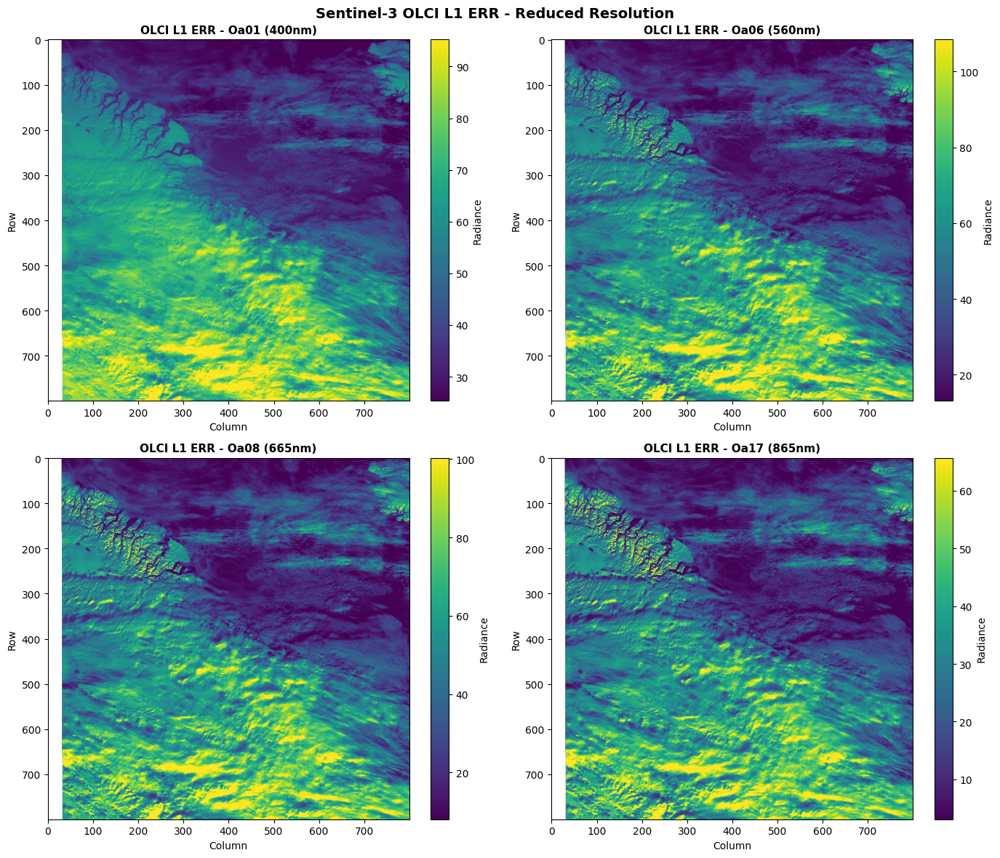

✅ OLCI L1 ERR visualization complete!


In [7]:
# Read OLCI L1 ERR bands
print("Reading OLCI L1 ERR (Reduced Resolution) spectral bands...")

err_data = {}
for name, subdataset in olci_bands.items():
    try:
        data, meta = read_band_data(
            PRODUCTS["OLCI_L1_ERR"]["url"], subdataset, size=800
        )
        err_data[name] = data
        print(
            f"  ✅ {name}: {data.shape}, range [{np.nanmin(data):.2f}, {np.nanmax(data):.2f}]"
        )
    except Exception as e:
        print(f"  ❌ {name}: {e}")

# Visualize
if err_data:
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    axes = axes.flatten()

    for idx, (name, data) in enumerate(err_data.items()):
        vmin, vmax = np.nanpercentile(data, [2, 98])
        im = axes[idx].imshow(data, cmap="viridis", vmin=vmin, vmax=vmax)
        axes[idx].set_title(f"OLCI L1 ERR - {name}", fontsize=11, fontweight="bold")
        axes[idx].set_xlabel("Column")
        axes[idx].set_ylabel("Row")
        plt.colorbar(im, ax=axes[idx], label="Radiance", fraction=0.046)

    plt.suptitle(
        "Sentinel-3 OLCI L1 ERR - Reduced Resolution", fontsize=14, fontweight="bold"
    )
    plt.tight_layout()
    plt.show()

    print("✅ OLCI L1 ERR visualization complete!")

## <a id='toc1_4_'></a>[OLCI Level-2 LFR - Land Products](#toc0_)

The L2 LFR product contains derived land parameters like vegetation indices.

In [8]:
# Discover L2 LFR subdatasets
print("Discovering OLCI L2 LFR subdatasets...")

lfr_subdatasets = product_subdatasets.get("OLCI_L2_LFR", [])

# Find measurement subdatasets
lfr_measurements = [
    sd
    for sd in lfr_subdatasets
    if "measurements/" in sd and "latitude" not in sd and "longitude" not in sd
]

print(f"\nAvailable L2 LFR measurements ({len(lfr_measurements)}):")
for sd in lfr_measurements[:15]:
    print(f"  {sd}")

Discovering OLCI L2 LFR subdatasets...

Available L2 LFR measurements (5):
  /measurements/gifapar
  /measurements/iwv
  /measurements/otci
  /measurements/rc681
  /measurements/rc865


Reading OLCI L2 LFR land products...
  ✅ GIFAPAR: (800, 800), range [0.0000, 1.0000]
  ✅ GIFAPAR: (800, 800), range [0.0000, 1.0000]
  ✅ OTCI: (800, 800), range [0.2303, 6.4744]
  ✅ OTCI: (800, 800), range [0.2303, 6.4744]
  ✅ IWV: (800, 800), range [0.0000, 67.2000]
  ✅ IWV: (800, 800), range [0.0000, 67.2000]
  ✅ RC681: (800, 800), range [0.0000, 0.2907]
  ✅ RC681: (800, 800), range [0.0000, 0.2907]


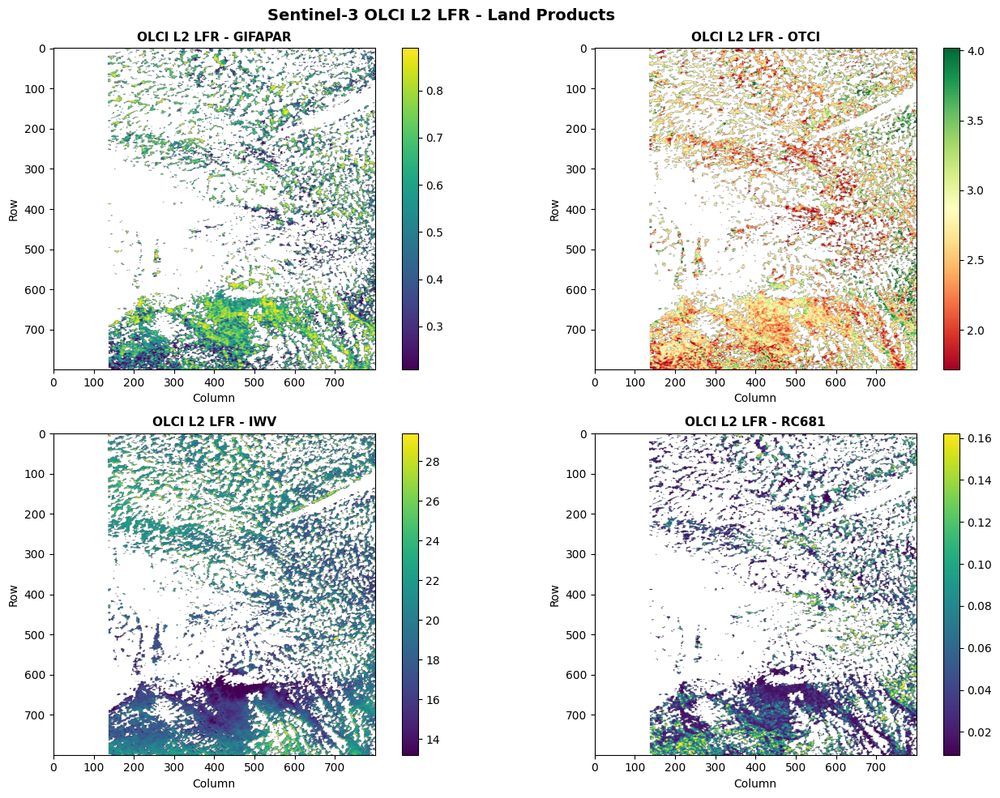

In [9]:
# Read L2 LFR products - try common land products
print("Reading OLCI L2 LFR land products...")

# Common L2 land product names to try
l2_products_to_try = [
    ("GIFAPAR", "measurements/gifapar"),  # OLCI Global Vegetation Index
    ("OTCI", "measurements/otci"),  # OLCI Terrestrial Chlorophyll Index
    ("IWV", "measurements/iwv"),  # Integrated Water Vapour
    ("RC681", "measurements/rc681"),  # Rectified Reflectance 681nm
]

lfr_data = {}
for name, subdataset in l2_products_to_try:
    try:
        data, meta = read_band_data(
            PRODUCTS["OLCI_L2_LFR"]["url"], subdataset, size=800
        )
        lfr_data[name] = data
        print(
            f"  ✅ {name}: {data.shape}, range [{np.nanmin(data):.4f}, {np.nanmax(data):.4f}]"
        )
    except Exception as e:
        print(f"  ⚠️  {name}: Not available or error - {str(e)[:50]}")

# If we found products, visualize them
if lfr_data:
    n_products = len(lfr_data)
    cols = min(2, n_products)
    rows = (n_products + 1) // 2

    fig, axes = plt.subplots(rows, cols, figsize=(7 * cols, 5 * rows))
    if n_products == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for idx, (name, data) in enumerate(lfr_data.items()):
        vmin, vmax = np.nanpercentile(data, [2, 98])

        # Choose colormap based on product
        if "OGVI" in name or "OTCI" in name:
            cmap = "RdYlGn"
        else:
            cmap = "viridis"

        im = axes[idx].imshow(data, cmap=cmap, vmin=vmin, vmax=vmax)
        axes[idx].set_title(f"OLCI L2 LFR - {name}", fontsize=11, fontweight="bold")
        axes[idx].set_xlabel("Column")
        axes[idx].set_ylabel("Row")
        plt.colorbar(im, ax=axes[idx], fraction=0.046)

    # Hide unused subplots
    for idx in range(len(lfr_data), len(axes)):
        axes[idx].axis("off")

    plt.suptitle(
        "Sentinel-3 OLCI L2 LFR - Land Products", fontsize=14, fontweight="bold"
    )
    plt.tight_layout()
    plt.show()
else:
    print("⚠️  No L2 LFR products loaded. Checking available subdatasets...")
    print(f"Available: {lfr_measurements[:5]}")

## <a id='toc1_5_'></a>[SLSTR Level-1 RBT - Radiances and Brightness Temperatures](#toc0_)

The SLSTR instrument provides thermal and visible/NIR radiances for sea and land surface temperature retrieval.

In [61]:
# Discover SLSTR L1 RBT subdatasets
print("Discovering SLSTR L1 RBT subdatasets...")

rbt_subdatasets = product_subdatasets.get("SLSTR_L1_RBT", [])

# Find measurement subdatasets
rbt_measurements = [sd for sd in rbt_subdatasets if "measurements/" in sd]

print(f"\nAvailable SLSTR L1 RBT measurements ({len(rbt_measurements)}):")
for sd in rbt_measurements[:20]:
    print(f"  {sd}")

Discovering SLSTR L1 RBT subdatasets...

Available SLSTR L1 RBT measurements (136):
  /measurements/anadir/elevation
  /measurements/anadir/latitude
  /measurements/anadir/longitude
  /measurements/anadir/s1_radiance_an
  /measurements/anadir/s2_radiance_an
  /measurements/anadir/s3_radiance_an
  /measurements/anadir/s4_radiance_an
  /measurements/anadir/s5_radiance_an
  /measurements/anadir/s6_radiance_an
  /measurements/anadir/x
  /measurements/anadir/y
  /measurements/anadir/orphan/elevation_an
  /measurements/anadir/orphan/latitude_an
  /measurements/anadir/orphan/longitude_an
  /measurements/anadir/orphan/s1_radiance
  /measurements/anadir/orphan/s2_radiance
  /measurements/anadir/orphan/s3_radiance
  /measurements/anadir/orphan/s4_radiance
  /measurements/anadir/orphan/s5_radiance
  /measurements/anadir/orphan/s6_radiance


Reading SLSTR L1 RBT bands...
  ✅ S1 (555nm): (600, 600), range [80.45, 177.95]
  ✅ S2 (659nm): (600, 600), range [62.18, 180.45]
  ✅ S3 (865nm): (600, 600), range [49.04, 143.32]
  ✅ S7 (3.7μm BT): (600, 600), range [295.65, 312.34]
  ✅ S8 (10.8μm BT): (600, 600), range [289.93, 313.81]
  ✅ S9 (12μm BT): (600, 600), range [288.28, 312.14]


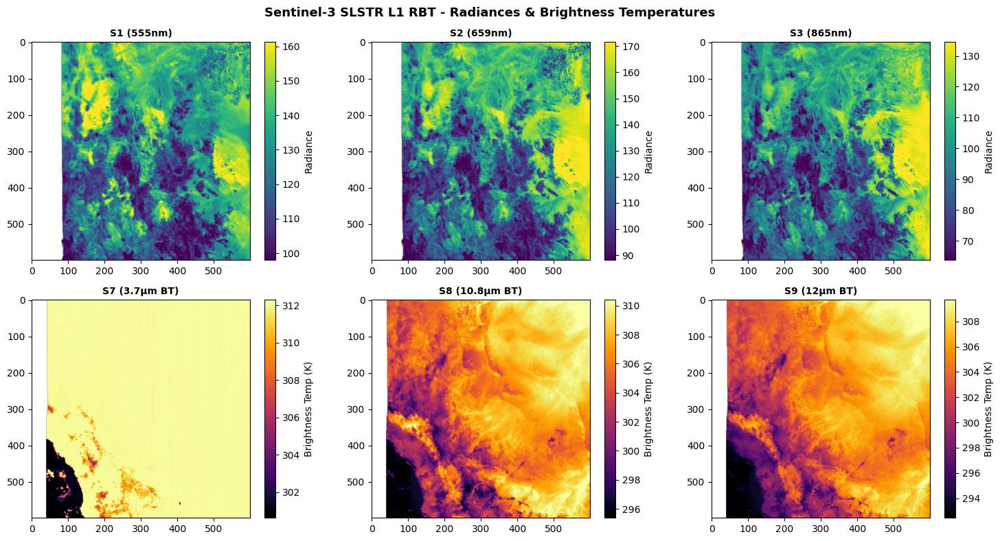

In [10]:
# Read SLSTR L1 RBT bands
print("Reading SLSTR L1 RBT bands...")

# SLSTR bands to try (common naming patterns)
slstr_bands_to_try = [
    ("S1 (555nm)", "measurements/anadir/s1_radiance_an"),
    ("S2 (659nm)", "measurements/anadir/s2_radiance_an"),
    ("S3 (865nm)", "measurements/anadir/s3_radiance_an"),
    ("S7 (3.7μm BT)", "measurements/inadir/s7_bt_in"),
    ("S8 (10.8μm BT)", "measurements/inadir/s8_bt_in"),
    ("S9 (12μm BT)", "measurements/inadir/s9_bt_in"),
]

rbt_data = {}
for name, subdataset in slstr_bands_to_try:
    try:
        data, meta = read_band_data(
            PRODUCTS["SLSTR_L1_RBT"]["url"], subdataset, size=600
        )
        rbt_data[name] = data
        print(
            f"  ✅ {name}: {data.shape}, range [{np.nanmin(data):.2f}, {np.nanmax(data):.2f}]"
        )
    except Exception as e:
        print(f"  ⚠️  {name}: {str(e)[:60]}")

# Visualize
if rbt_data:
    n_bands = len(rbt_data)
    cols = min(3, n_bands)
    rows = (n_bands + 2) // 3

    fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 4 * rows))
    if n_bands == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for idx, (name, data) in enumerate(rbt_data.items()):
        vmin, vmax = np.nanpercentile(data, [2, 98])

        # Use thermal colormap for brightness temperature bands
        if "BT" in name or "μm" in name:
            cmap = "inferno"
            label = "Brightness Temp (K)"
        else:
            cmap = "viridis"
            label = "Radiance"

        im = axes[idx].imshow(data, cmap=cmap, vmin=vmin, vmax=vmax)
        axes[idx].set_title(f"{name}", fontsize=10, fontweight="bold")
        plt.colorbar(im, ax=axes[idx], label=label, fraction=0.046)

    # Hide unused
    for idx in range(len(rbt_data), len(axes)):
        axes[idx].axis("off")

    plt.suptitle(
        "Sentinel-3 SLSTR L1 RBT - Radiances & Brightness Temperatures",
        fontsize=13,
        fontweight="bold",
    )
    plt.tight_layout()
    plt.show()
else:
    print("⚠️  No SLSTR L1 RBT bands loaded")

## <a id='toc1_6_'></a>[SLSTR Level-2 LST - Land Surface Temperature](#toc0_)

The LST product provides derived land surface temperature.

In [11]:
# Discover SLSTR L2 LST subdatasets
print("Discovering SLSTR L2 LST subdatasets...")

lst_subdatasets = product_subdatasets.get("SLSTR_L2_LST", [])

# Find measurement subdatasets
lst_measurements = [sd for sd in lst_subdatasets if "measurements/" in sd]

print(f"\nAvailable SLSTR L2 LST measurements ({len(lst_measurements)}):")
for sd in lst_measurements[:15]:
    print(f"  {sd}")

lst_conditions = [sd for sd in lst_subdatasets if "conditions/" in sd]
print(f"\nAvailable SLSTR L2 LST conditions ({len(lst_conditions)}):")

for sd in lst_conditions[:15]:
    print(f"  {sd}")

Discovering SLSTR L2 LST subdatasets...

Available SLSTR L2 LST measurements (10):
  /measurements/latitude
  /measurements/longitude
  /measurements/lst
  /measurements/x
  /measurements/y
  /measurements/orphan/latitude
  /measurements/orphan/longitude
  /measurements/orphan/lst
  /measurements/orphan/x
  /measurements/orphan/y

Available SLSTR L2 LST conditions (52):
  /conditions/auxiliary/biome
  /conditions/auxiliary/elevation
  /conditions/auxiliary/fraction
  /conditions/auxiliary/ndvi
  /conditions/auxiliary/tcwv
  /conditions/auxiliary/orphan/biome
  /conditions/auxiliary/orphan/elevation
  /conditions/auxiliary/orphan/fraction
  /conditions/auxiliary/orphan/ndvi
  /conditions/auxiliary/orphan/tcwv
  /conditions/geometry/latitude
  /conditions/geometry/longitude
  /conditions/geometry/sat_azimuth_tn
  /conditions/geometry/sat_path_tn
  /conditions/geometry/sat_zenith_tn


Reading SLSTR L2 LST products...
  ✅ LST: (600, 600), range [-32767.00, 1604.00]
  ✅ LST Uncertainty: (600, 600), range [105.00, 2258.00]
  ✅ NDVI: (600, 600), range [-2147.00, 8692.00]
  ✅ Biome: (600, 600), range [0.00, 220.00]


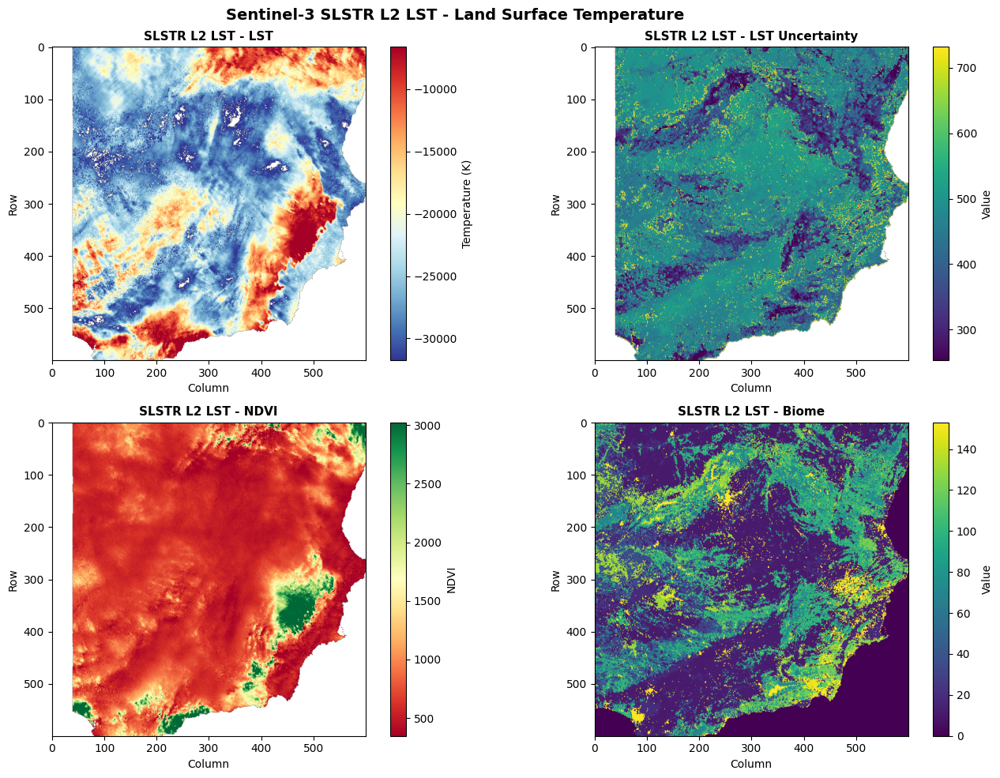

In [12]:
# Read SLSTR L2 LST data
print("Reading SLSTR L2 LST products...")

lst_products_to_try = [
    ("LST", "measurements/lst"),
    ("LST Uncertainty", "quality/lst_uncertainty"),
    ("NDVI", "conditions/auxiliary/ndvi"),
    ("Biome", "conditions/auxiliary/biome"),
]

lst_data = {}
for name, subdataset in lst_products_to_try:
    try:
        data, meta = read_band_data(
            PRODUCTS["SLSTR_L2_LST"]["url"], subdataset, size=600
        )
        lst_data[name] = data
        print(
            f"  ✅ {name}: {data.shape}, range [{np.nanmin(data):.2f}, {np.nanmax(data):.2f}]"
        )
    except Exception as e:
        print(f"  ⚠️  {name}: {str(e)[:60]}")

# Visualize LST
if lst_data:
    n_products = len(lst_data)
    cols = min(2, n_products)
    rows = (n_products + 1) // 2

    fig, axes = plt.subplots(rows, cols, figsize=(7 * cols, 5 * rows))
    if n_products == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for idx, (name, data) in enumerate(lst_data.items()):
        vmin, vmax = np.nanpercentile(data, [2, 98])

        # Choose appropriate colormap
        if "LST" in name and "Uncertainty" not in name:
            cmap = "RdYlBu_r"  # Temperature colormap
            label = "Temperature (K)"
        elif "NDVI" in name:
            cmap = "RdYlGn"
            label = "NDVI"
        else:
            cmap = "viridis"
            label = "Value"

        im = axes[idx].imshow(data, cmap=cmap, vmin=vmin, vmax=vmax)
        axes[idx].set_title(f"SLSTR L2 LST - {name}", fontsize=11, fontweight="bold")
        axes[idx].set_xlabel("Column")
        axes[idx].set_ylabel("Row")
        plt.colorbar(im, ax=axes[idx], label=label, fraction=0.046)

    # Hide unused
    for idx in range(len(lst_data), len(axes)):
        axes[idx].axis("off")

    plt.suptitle(
        "Sentinel-3 SLSTR L2 LST - Land Surface Temperature",
        fontsize=14,
        fontweight="bold",
    )
    plt.tight_layout()
    plt.show()
else:
    print("⚠️  No SLSTR L2 LST products loaded")

In [13]:
# Demonstrate EOPFZARR Geolocation Arrays Support for ALL Products
print("=" * 80)
print("EOPFZARR GEOLOCATION ARRAYS DEMO - All Sentinel-3 Products")
print("=" * 80)

# Define sample subdatasets for each product type
product_samples = {
    "OLCI_L1_EFR": "measurements/oa01_radiance",
    "OLCI_L1_ERR": "measurements/oa01_radiance",
    "OLCI_L2_LFR": "measurements/gifapar",
    "SLSTR_L1_RBT": "measurements/inadir/s8_bt_in",
    "SLSTR_L2_LST": "measurements/lst",
}

geoloc_results = {}

for product_key, subdataset in product_samples.items():
    url = PRODUCTS[product_key]["url"]
    path = eopfzarr_path(url, subdataset)

    print(f"\n{'─'*70}")
    print(f"📦 {product_key}")
    print(f"   Subdataset: {subdataset}")

    try:
        ds = gdal.Open(path)
        if ds:
            geoloc = ds.GetMetadata("GEOLOCATION")

            if geoloc:
                x_path = geoloc.get("X_DATASET", "N/A")
                y_path = geoloc.get("Y_DATASET", "N/A")
                srs = geoloc.get("SRS", "N/A")

                # Extract just the measurement path
                x_meas = x_path.split(":")[-1] if x_path else "N/A"
                y_meas = y_path.split(":")[-1] if y_path else "N/A"

                print("   ✅ GEOLOCATION metadata found!")
                print(f"      X_DATASET (Lon): {x_meas}")
                print(f"      Y_DATASET (Lat): {y_meas}")
                print(f"      PIXEL_STEP: {geoloc.get('PIXEL_STEP', 'N/A')}")
                print(f"      LINE_STEP: {geoloc.get('LINE_STEP', 'N/A')}")

                # Check if coordinates are WGS84
                if "WGS" in srs or "EPSG" in srs:
                    print("      SRS: WGS 84 (EPSG:4326)")

                geoloc_results[product_key] = {
                    "status": "success",
                    "x_path": x_path,
                    "y_path": y_path,
                    "size": f"{ds.RasterXSize}x{ds.RasterYSize}",
                    "subdataset": subdataset,
                }
            else:
                print("   ⚠️ No GEOLOCATION metadata")
                geoloc_results[product_key] = {"status": "no_geoloc"}

            ds = None
        else:
            print("   ❌ Failed to open dataset")
            geoloc_results[product_key] = {"status": "failed"}

    except Exception as e:
        print(f"   ❌ Error: {str(e)[:50]}")
        geoloc_results[product_key] = {"status": "error", "msg": str(e)}

# Summary
print(f"\n{'='*80}")
print("GEOLOCATION ARRAYS SUMMARY")
print("=" * 80)
success_count = sum(1 for r in geoloc_results.values() if r["status"] == "success")
print(f"\n✅ {success_count}/{len(geoloc_results)} products have GEOLOCATION arrays\n")

print(f"{'Product':<20} {'Status':<12} {'Lon/Lat Arrays'}")
print("-" * 70)
for product, result in geoloc_results.items():
    if result["status"] == "success":
        lon_arr = result["x_path"].split("/")[-1]
        lat_arr = result["y_path"].split("/")[-1]
        print(f"{product:<20} {'✅ Found':<12} {lon_arr} / {lat_arr}")
    else:
        print(f"{product:<20} {'❌ Missing':<12} -")

# Visualize geolocation for ALL 5 products
print("\n" + "=" * 80)
print("GEOGRAPHIC VISUALIZATION - All 5 Sentinel-3 Products")
print("=" * 80)

EOPFZARR GEOLOCATION ARRAYS DEMO - All Sentinel-3 Products

──────────────────────────────────────────────────────────────────────
📦 OLCI_L1_EFR
   Subdataset: measurements/oa01_radiance
   ✅ GEOLOCATION metadata found!
      X_DATASET (Lon): //measurements/longitude
      Y_DATASET (Lat): //measurements/latitude
      PIXEL_STEP: 1
      LINE_STEP: 1
      SRS: WGS 84 (EPSG:4326)

──────────────────────────────────────────────────────────────────────
📦 OLCI_L1_ERR
   Subdataset: measurements/oa01_radiance
   ✅ GEOLOCATION metadata found!
      X_DATASET (Lon): //measurements/longitude
      Y_DATASET (Lat): //measurements/latitude
      PIXEL_STEP: 1
      LINE_STEP: 1
      SRS: WGS 84 (EPSG:4326)

──────────────────────────────────────────────────────────────────────
📦 OLCI_L2_LFR
   Subdataset: measurements/gifapar
   ✅ GEOLOCATION metadata found!
      X_DATASET (Lon): //measurements/longitude
      Y_DATASET (Lat): //measurements/latitude
      PIXEL_STEP: 1
      LINE_STEP: 1
  

OLCI_L1_EFR: Lat [-22.03° to -21.06°], Lon [21.88° to 22.88°]
OLCI_L1_ERR: Lat [69.04° to 72.41°], Lon [-76.05° to -66.24°]
OLCI_L2_LFR: Lat [51.61° to 52.45°], Lon [14.01° to 15.30°]
SLSTR_L1_RBT: Lat [17.86° to 20.97°], Lon [41.93° to 45.23°]
SLSTR_L2_LST: Lat [38996381.00° to 41989955.00°], Lon [-6862632.00° to -2885982.00°]


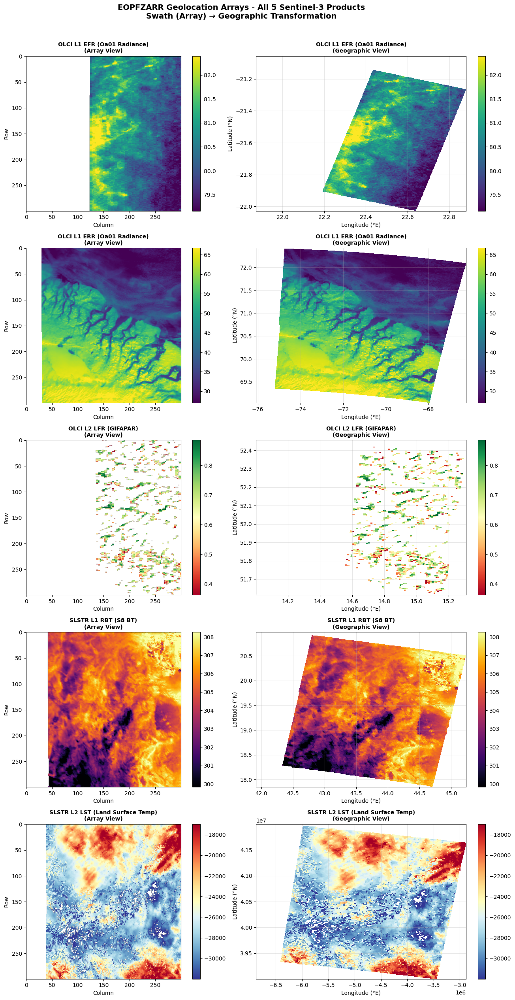

In [14]:
# Create a 5x2 grid for all products (Array View | Geographic View)
fig, axes = plt.subplots(5, 2, figsize=(14, 25))

# All products to visualize
viz_products = [
    (
        "OLCI_L1_EFR",
        "measurements/oa01_radiance",
        "OLCI L1 EFR (Oa01 Radiance)",
        "viridis",
    ),
    (
        "OLCI_L1_ERR",
        "measurements/oa01_radiance",
        "OLCI L1 ERR (Oa01 Radiance)",
        "viridis",
    ),
    ("OLCI_L2_LFR", "measurements/gifapar", "OLCI L2 LFR (GIFAPAR)", "RdYlGn"),
    ("SLSTR_L1_RBT", "measurements/inadir/s8_bt_in", "SLSTR L1 RBT (S8 BT)", "inferno"),
    (
        "SLSTR_L2_LST",
        "measurements/lst",
        "SLSTR L2 LST (Land Surface Temp)",
        "RdYlBu_r",
    ),
]

for row, (product_key, subdataset, title, cmap) in enumerate(viz_products):
    url = PRODUCTS[product_key]["url"]
    path = eopfzarr_path(url, subdataset)

    try:
        ds = gdal.Open(path)
        geoloc = ds.GetMetadata("GEOLOCATION")

        if geoloc and ds:
            # Read coordinate arrays
            lon_ds = gdal.Open(geoloc["X_DATASET"])
            lat_ds = gdal.Open(geoloc["Y_DATASET"])

            # Read subset
            size = 300
            lon = lon_ds.GetRasterBand(1).ReadAsArray(
                0, 0, min(size, lon_ds.RasterXSize), min(size, lon_ds.RasterYSize)
            )
            lat = lat_ds.GetRasterBand(1).ReadAsArray(
                0, 0, min(size, lat_ds.RasterXSize), min(size, lat_ds.RasterYSize)
            )
            data = (
                ds.GetRasterBand(1)
                .ReadAsArray(0, 0, min(size, ds.RasterXSize), min(size, ds.RasterYSize))
                .astype(np.float32)
            )

            # Handle nodata
            nodata = ds.GetRasterBand(1).GetNoDataValue()
            if nodata is not None:
                data[data == nodata] = np.nan

            # Match dimensions
            min_r = min(data.shape[0], lat.shape[0], lon.shape[0])
            min_c = min(data.shape[1], lat.shape[1], lon.shape[1])
            data, lat, lon = (
                data[:min_r, :min_c],
                lat[:min_r, :min_c],
                lon[:min_r, :min_c],
            )

            vmin, vmax = np.nanpercentile(data, [2, 98])

            # Array view
            im1 = axes[row, 0].imshow(data, cmap=cmap, vmin=vmin, vmax=vmax)
            axes[row, 0].set_title(
                f"{title}\n(Array View)", fontweight="bold", fontsize=10
            )
            axes[row, 0].set_xlabel("Column")
            axes[row, 0].set_ylabel("Row")
            plt.colorbar(im1, ax=axes[row, 0], fraction=0.046)

            # Geographic view
            step = 2
            im2 = axes[row, 1].pcolormesh(
                lon[::step, ::step],
                lat[::step, ::step],
                data[::step, ::step],
                cmap=cmap,
                vmin=vmin,
                vmax=vmax,
                shading="auto",
            )
            axes[row, 1].set_title(
                f"{title}\n(Geographic View)", fontweight="bold", fontsize=10
            )
            axes[row, 1].set_xlabel("Longitude (°E)")
            axes[row, 1].set_ylabel("Latitude (°N)")
            axes[row, 1].grid(True, alpha=0.3)
            plt.colorbar(im2, ax=axes[row, 1], fraction=0.046)

            # Print coordinate range
            print(
                f"{product_key}: Lat [{np.nanmin(lat):.2f}° to {np.nanmax(lat):.2f}°], Lon [{np.nanmin(lon):.2f}° to {np.nanmax(lon):.2f}°]"
            )

            lon_ds = lat_ds = ds = None

    except Exception as e:
        print(f"{product_key}: Error - {str(e)[:50]}")
        axes[row, 0].text(
            0.5,
            0.5,
            f"Error: {str(e)[:30]}",
            ha="center",
            va="center",
            transform=axes[row, 0].transAxes,
        )
        axes[row, 1].text(
            0.5,
            0.5,
            f"Error: {str(e)[:30]}",
            ha="center",
            va="center",
            transform=axes[row, 1].transAxes,
        )

plt.suptitle(
    "EOPFZARR Geolocation Arrays - All 5 Sentinel-3 Products\nSwath (Array) → Geographic Transformation",
    fontsize=14,
    fontweight="bold",
    y=1.01,
)
plt.tight_layout()
plt.show()

## <a id='toc1_8_'></a>[Product Comparison Summary](#toc0_)

In [15]:
# Summary table
print("\n" + "=" * 100)
print("SENTINEL-3 PRODUCT SUMMARY")
print("=" * 100)
print(f"{'Product':<20} {'Subdatasets':<15} {'Description'}")
print("-" * 100)

for key, subdatasets in product_subdatasets.items():
    count = len(subdatasets) if subdatasets else 0
    desc = PRODUCTS[key]["description"][:50]
    print(f"{key:<20} {count:<15} {desc}")


SENTINEL-3 PRODUCT SUMMARY
Product              Subdatasets     Description
----------------------------------------------------------------------------------------------------
OLCI_L1_EFR          123             TOA Radiances - 21 spectral bands (400-1020nm)
OLCI_L1_ERR          68              TOA Radiances - Reduced resolution (1.2km)
OLCI_L2_LFR          37              Land products - OGVI, OTCI, RC681, etc.
SLSTR_L1_RBT         530             Radiances and Brightness Temperatures
SLSTR_L2_LST         84              Land Surface Temperature


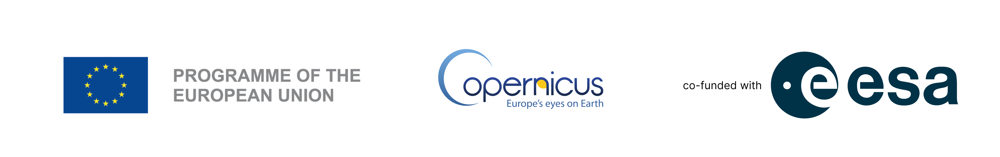